# GANomaly
- 2020.08.16 : gen 10 / lr 1e-5

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-5

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 10)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3881 / DC_loss : 0.6345
- D(x):0.5021 / D(DC(z1)) : 0.5030 / D(DC(z2)) : 0.5302
[1/100][1/21]
- D_loss : 1.3819 / DC_loss : 0.6375
- D(x):0.5005 / D(DC(z1)) : 0.4982 / D(DC(z2)) : 0.5286
[1/100][2/21]
- D_loss : 1.3764 / DC_loss : 0.6421
- D(x):0.4993 / D(DC(z1)) : 0.4942 / D(DC(z2)) : 0.5262
[1/100][3/21]
- D_loss : 1.3662 / DC_loss : 0.6501
- D(x):0.4997 / D(DC(z1)) : 0.4894 / D(DC(z2)) : 0.5220
[1/100][4/21]
- D_loss : 1.3632 / DC_loss : 0.6534
- D(x):0.4991 / D(DC(z1)) : 0.4872 / D(DC(z2)) : 0.5203
[1/100][5/21]
- D_loss : 1.3535 / DC_loss : 0.6606
- D(x):0.5000 / D(DC(z1)) : 0.4833 / D(DC(z2)) : 0.5166
[1/100][6/21]
- D_loss : 1.3470 / DC_loss : 0.6682
- D(x):0.4999 / D(DC(z1)) : 0.4797 / D(DC(z2)) : 0.5127
[1/100][7/21]
- D_loss : 1.3403 / DC_loss : 0.6726
- D(x):0.4995 / D(DC(z1)) : 0.4758 / D(DC(z2)) : 0.5104
[1/100][8/21]
- D_loss : 1.3360 / DC_loss : 0.6763
- D(x):0.5004 / D(DC(z1)) : 0.4745 / D(DC(z2)) : 0.5085
[1/100][9/21]
- D_loss : 1.3330 / DC_

[4/100][14/21]
- D_loss : 1.4510 / DC_loss : 0.6332
- D(x):0.4911 / D(DC(z1)) : 0.5225 / D(DC(z2)) : 0.5309
[4/100][15/21]
- D_loss : 1.4600 / DC_loss : 0.6289
- D(x):0.4920 / D(DC(z1)) : 0.5277 / D(DC(z2)) : 0.5332
[4/100][16/21]
- D_loss : 1.4654 / DC_loss : 0.6274
- D(x):0.4920 / D(DC(z1)) : 0.5302 / D(DC(z2)) : 0.5340
[4/100][17/21]
- D_loss : 1.4731 / DC_loss : 0.6293
- D(x):0.4888 / D(DC(z1)) : 0.5308 / D(DC(z2)) : 0.5330
[4/100][18/21]
- D_loss : 1.4593 / DC_loss : 0.6324
- D(x):0.4946 / D(DC(z1)) : 0.5299 / D(DC(z2)) : 0.5314
[4/100][19/21]
- D_loss : 1.4570 / DC_loss : 0.6343
- D(x):0.4945 / D(DC(z1)) : 0.5287 / D(DC(z2)) : 0.5303
[4/100][20/21]
- D_loss : 1.4663 / DC_loss : 0.6347
- D(x):0.4889 / D(DC(z1)) : 0.5278 / D(DC(z2)) : 0.5301
[5/100][0/21]
- D_loss : 1.4625 / DC_loss : 0.6295
- D(x):0.4915 / D(DC(z1)) : 0.5284 / D(DC(z2)) : 0.5329
[5/100][1/21]
- D_loss : 1.4653 / DC_loss : 0.6236
- D(x):0.4928 / D(DC(z1)) : 0.5310 / D(DC(z2)) : 0.5360
[5/100][2/21]
- D_loss : 1.468

[8/100][7/21]
- D_loss : 1.3658 / DC_loss : 0.7612
- D(x):0.4847 / D(DC(z1)) : 0.4730 / D(DC(z2)) : 0.4671
[8/100][8/21]
- D_loss : 1.3535 / DC_loss : 0.7741
- D(x):0.4854 / D(DC(z1)) : 0.4674 / D(DC(z2)) : 0.4611
[8/100][9/21]
- D_loss : 1.3466 / DC_loss : 0.7870
- D(x):0.4834 / D(DC(z1)) : 0.4614 / D(DC(z2)) : 0.4552
[8/100][10/21]
- D_loss : 1.3409 / DC_loss : 0.7985
- D(x):0.4810 / D(DC(z1)) : 0.4555 / D(DC(z2)) : 0.4500
[8/100][11/21]
- D_loss : 1.3335 / DC_loss : 0.8080
- D(x):0.4801 / D(DC(z1)) : 0.4505 / D(DC(z2)) : 0.4458
[8/100][12/21]
- D_loss : 1.3155 / DC_loss : 0.8174
- D(x):0.4849 / D(DC(z1)) : 0.4461 / D(DC(z2)) : 0.4416
[8/100][13/21]
- D_loss : 1.3206 / DC_loss : 0.8270
- D(x):0.4788 / D(DC(z1)) : 0.4419 / D(DC(z2)) : 0.4373
[8/100][14/21]
- D_loss : 1.3045 / DC_loss : 0.8342
- D(x):0.4830 / D(DC(z1)) : 0.4377 / D(DC(z2)) : 0.4342
[8/100][15/21]
- D_loss : 1.3059 / DC_loss : 0.8379
- D(x):0.4798 / D(DC(z1)) : 0.4347 / D(DC(z2)) : 0.4326
[8/100][16/21]
- D_loss : 1.297

[11/100][20/21]
- D_loss : 1.2447 / DC_loss : 0.8548
- D(x):0.5046 / D(DC(z1)) : 0.4288 / D(DC(z2)) : 0.4254
[12/100][0/21]
- D_loss : 1.2325 / DC_loss : 0.8630
- D(x):0.5085 / D(DC(z1)) : 0.4263 / D(DC(z2)) : 0.4219
[12/100][1/21]
- D_loss : 1.2550 / DC_loss : 0.8711
- D(x):0.4943 / D(DC(z1)) : 0.4229 / D(DC(z2)) : 0.4185
[12/100][2/21]
- D_loss : 1.2458 / DC_loss : 0.8781
- D(x):0.4959 / D(DC(z1)) : 0.4194 / D(DC(z2)) : 0.4156
[12/100][3/21]
- D_loss : 1.2253 / DC_loss : 0.8829
- D(x):0.5038 / D(DC(z1)) : 0.4166 / D(DC(z2)) : 0.4136
[12/100][4/21]
- D_loss : 1.2195 / DC_loss : 0.8884
- D(x):0.5048 / D(DC(z1)) : 0.4145 / D(DC(z2)) : 0.4113
[12/100][5/21]
- D_loss : 1.2178 / DC_loss : 0.8942
- D(x):0.5038 / D(DC(z1)) : 0.4123 / D(DC(z2)) : 0.4089
[12/100][6/21]
- D_loss : 1.2234 / DC_loss : 0.8994
- D(x):0.4991 / D(DC(z1)) : 0.4099 / D(DC(z2)) : 0.4068
[12/100][7/21]
- D_loss : 1.2173 / DC_loss : 0.9042
- D(x):0.5003 / D(DC(z1)) : 0.4077 / D(DC(z2)) : 0.4049
[12/100][8/21]
- D_loss : 1

[15/100][12/21]
- D_loss : 1.3413 / DC_loss : 0.6609
- D(x):0.5259 / D(DC(z1)) : 0.5022 / D(DC(z2)) : 0.5164
[15/100][13/21]
- D_loss : 1.4026 / DC_loss : 0.6980
- D(x):0.5135 / D(DC(z1)) : 0.5203 / D(DC(z2)) : 0.4976
[15/100][14/21]
- D_loss : 1.3449 / DC_loss : 0.7880
- D(x):0.5217 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.4547
[15/100][15/21]
- D_loss : 1.2960 / DC_loss : 0.8614
- D(x):0.5044 / D(DC(z1)) : 0.4566 / D(DC(z2)) : 0.4226
[15/100][16/21]
- D_loss : 1.2687 / DC_loss : 0.8991
- D(x):0.4895 / D(DC(z1)) : 0.4240 / D(DC(z2)) : 0.4069
[15/100][17/21]
- D_loss : 1.2959 / DC_loss : 0.9079
- D(x):0.4640 / D(DC(z1)) : 0.4081 / D(DC(z2)) : 0.4034
[15/100][18/21]
- D_loss : 1.1942 / DC_loss : 0.9231
- D(x):0.5093 / D(DC(z1)) : 0.4045 / D(DC(z2)) : 0.3973
[15/100][19/21]
- D_loss : 1.1892 / DC_loss : 0.9378
- D(x):0.5069 / D(DC(z1)) : 0.3985 / D(DC(z2)) : 0.3915
[15/100][20/21]
- D_loss : 1.1661 / DC_loss : 0.9666
- D(x):0.5135 / D(DC(z1)) : 0.3929 / D(DC(z2)) : 0.3804
[16/100][0/21]
- D_

[19/100][4/21]
- D_loss : 1.1447 / DC_loss : 0.9439
- D(x):0.5280 / D(DC(z1)) : 0.3967 / D(DC(z2)) : 0.3891
[19/100][5/21]
- D_loss : 1.1498 / DC_loss : 0.9559
- D(x):0.5194 / D(DC(z1)) : 0.3896 / D(DC(z2)) : 0.3845
[19/100][6/21]
- D_loss : 1.1299 / DC_loss : 0.9705
- D(x):0.5256 / D(DC(z1)) : 0.3850 / D(DC(z2)) : 0.3789
[19/100][7/21]
- D_loss : 1.1173 / DC_loss : 0.9841
- D(x):0.5275 / D(DC(z1)) : 0.3794 / D(DC(z2)) : 0.3738
[19/100][8/21]
- D_loss : 1.1186 / DC_loss : 0.9966
- D(x):0.5225 / D(DC(z1)) : 0.3743 / D(DC(z2)) : 0.3691
[19/100][9/21]
- D_loss : 1.0946 / DC_loss : 1.0052
- D(x):0.5313 / D(DC(z1)) : 0.3697 / D(DC(z2)) : 0.3660
[19/100][10/21]
- D_loss : 1.1046 / DC_loss : 1.0055
- D(x):0.5236 / D(DC(z1)) : 0.3667 / D(DC(z2)) : 0.3659
[19/100][11/21]
- D_loss : 1.0690 / DC_loss : 1.0021
- D(x):0.5425 / D(DC(z1)) : 0.3669 / D(DC(z2)) : 0.3671
[19/100][12/21]
- D_loss : 1.0910 / DC_loss : 0.9803
- D(x):0.5323 / D(DC(z1)) : 0.3686 / D(DC(z2)) : 0.3752
[19/100][13/21]
- D_loss 

[22/100][17/21]
- D_loss : 1.1915 / DC_loss : 0.9003
- D(x):0.5187 / D(DC(z1)) : 0.4141 / D(DC(z2)) : 0.4065
[22/100][18/21]
- D_loss : 1.2099 / DC_loss : 0.8969
- D(x):0.5040 / D(DC(z1)) : 0.4080 / D(DC(z2)) : 0.4078
[22/100][19/21]
- D_loss : 1.2062 / DC_loss : 0.8909
- D(x):0.5072 / D(DC(z1)) : 0.4092 / D(DC(z2)) : 0.4103
[22/100][20/21]
- D_loss : 1.1861 / DC_loss : 0.8904
- D(x):0.5192 / D(DC(z1)) : 0.4114 / D(DC(z2)) : 0.4105
[23/100][0/21]
- D_loss : 1.1415 / DC_loss : 0.9061
- D(x):0.5428 / D(DC(z1)) : 0.4115 / D(DC(z2)) : 0.4041
[23/100][1/21]
- D_loss : 1.1971 / DC_loss : 0.9133
- D(x):0.5082 / D(DC(z1)) : 0.4051 / D(DC(z2)) : 0.4012
[23/100][2/21]
- D_loss : 1.1772 / DC_loss : 0.9189
- D(x):0.5158 / D(DC(z1)) : 0.4021 / D(DC(z2)) : 0.3990
[23/100][3/21]
- D_loss : 1.1431 / DC_loss : 0.9306
- D(x):0.5316 / D(DC(z1)) : 0.3999 / D(DC(z2)) : 0.3943
[23/100][4/21]
- D_loss : 1.1322 / DC_loss : 0.9458
- D(x):0.5331 / D(DC(z1)) : 0.3952 / D(DC(z2)) : 0.3884
[23/100][5/21]
- D_loss 

[26/100][9/21]
- D_loss : 1.1576 / DC_loss : 0.9465
- D(x):0.5127 / D(DC(z1)) : 0.3867 / D(DC(z2)) : 0.3881
[26/100][10/21]
- D_loss : 1.1498 / DC_loss : 0.9364
- D(x):0.5188 / D(DC(z1)) : 0.3893 / D(DC(z2)) : 0.3920
[26/100][11/21]
- D_loss : 1.1416 / DC_loss : 0.9286
- D(x):0.5265 / D(DC(z1)) : 0.3932 / D(DC(z2)) : 0.3951
[26/100][12/21]
- D_loss : 1.1293 / DC_loss : 0.9247
- D(x):0.5357 / D(DC(z1)) : 0.3964 / D(DC(z2)) : 0.3967
[26/100][13/21]
- D_loss : 1.1374 / DC_loss : 0.9163
- D(x):0.5329 / D(DC(z1)) : 0.3980 / D(DC(z2)) : 0.4000
[26/100][14/21]
- D_loss : 1.1223 / DC_loss : 0.9137
- D(x):0.5444 / D(DC(z1)) : 0.4018 / D(DC(z2)) : 0.4010
[26/100][15/21]
- D_loss : 1.1234 / DC_loss : 0.9133
- D(x):0.5448 / D(DC(z1)) : 0.4029 / D(DC(z2)) : 0.4012
[26/100][16/21]
- D_loss : 1.1290 / DC_loss : 0.9119
- D(x):0.5420 / D(DC(z1)) : 0.4032 / D(DC(z2)) : 0.4018
[26/100][17/21]
- D_loss : 1.1388 / DC_loss : 0.9047
- D(x):0.5372 / D(DC(z1)) : 0.4037 / D(DC(z2)) : 0.4047
[26/100][18/21]
- D_

[30/100][1/21]
- D_loss : 1.3928 / DC_loss : 0.5919
- D(x):0.5501 / D(DC(z1)) : 0.5475 / D(DC(z2)) : 0.5540
[30/100][2/21]
- D_loss : 1.4166 / DC_loss : 0.5898
- D(x):0.5399 / D(DC(z1)) : 0.5497 / D(DC(z2)) : 0.5551
[30/100][3/21]
- D_loss : 1.4203 / DC_loss : 0.5881
- D(x):0.5372 / D(DC(z1)) : 0.5489 / D(DC(z2)) : 0.5562
[30/100][4/21]
- D_loss : 1.3988 / DC_loss : 0.6123
- D(x):0.5292 / D(DC(z1)) : 0.5319 / D(DC(z2)) : 0.5431
[30/100][5/21]
- D_loss : 1.3414 / DC_loss : 0.6069
- D(x):0.5603 / D(DC(z1)) : 0.5320 / D(DC(z2)) : 0.5460
[30/100][6/21]
- D_loss : 1.3916 / DC_loss : 0.6076
- D(x):0.5415 / D(DC(z1)) : 0.5392 / D(DC(z2)) : 0.5457
[30/100][7/21]
- D_loss : 1.3787 / DC_loss : 0.6250
- D(x):0.5335 / D(DC(z1)) : 0.5262 / D(DC(z2)) : 0.5364
[30/100][8/21]
- D_loss : 1.3590 / DC_loss : 0.6273
- D(x):0.5444 / D(DC(z1)) : 0.5266 / D(DC(z2)) : 0.5351
[30/100][9/21]
- D_loss : 1.3387 / DC_loss : 0.6374
- D(x):0.5441 / D(DC(z1)) : 0.5166 / D(DC(z2)) : 0.5298
[30/100][10/21]
- D_loss : 1

[33/100][14/21]
- D_loss : 1.3880 / DC_loss : 0.6990
- D(x):0.4915 / D(DC(z1)) : 0.4920 / D(DC(z2)) : 0.4971
[33/100][15/21]
- D_loss : 1.4290 / DC_loss : 0.6888
- D(x):0.4764 / D(DC(z1)) : 0.4970 / D(DC(z2)) : 0.5023
[33/100][16/21]
- D_loss : 1.4184 / DC_loss : 0.6944
- D(x):0.4805 / D(DC(z1)) : 0.4960 / D(DC(z2)) : 0.4994
[33/100][17/21]
- D_loss : 1.3980 / DC_loss : 0.6915
- D(x):0.4930 / D(DC(z1)) : 0.4987 / D(DC(z2)) : 0.5009
[33/100][18/21]
- D_loss : 1.4091 / DC_loss : 0.7072
- D(x):0.4773 / D(DC(z1)) : 0.4879 / D(DC(z2)) : 0.4931
[33/100][19/21]
- D_loss : 1.4231 / DC_loss : 0.6907
- D(x):0.4785 / D(DC(z1)) : 0.4962 / D(DC(z2)) : 0.5013
[33/100][20/21]
- D_loss : 1.3895 / DC_loss : 0.7060
- D(x):0.4851 / D(DC(z1)) : 0.4861 / D(DC(z2)) : 0.4937
[34/100][0/21]
- D_loss : 1.3999 / DC_loss : 0.6911
- D(x):0.4909 / D(DC(z1)) : 0.4974 / D(DC(z2)) : 0.5011
[34/100][1/21]
- D_loss : 1.3953 / DC_loss : 0.6979
- D(x):0.4895 / D(DC(z1)) : 0.4937 / D(DC(z2)) : 0.4977
[34/100][2/21]
- D_lo

[37/100][6/21]
- D_loss : 1.3894 / DC_loss : 0.7004
- D(x):0.4906 / D(DC(z1)) : 0.4919 / D(DC(z2)) : 0.4964
[37/100][7/21]
- D_loss : 1.4112 / DC_loss : 0.7014
- D(x):0.4799 / D(DC(z1)) : 0.4917 / D(DC(z2)) : 0.4959
[37/100][8/21]
- D_loss : 1.3975 / DC_loss : 0.7077
- D(x):0.4854 / D(DC(z1)) : 0.4905 / D(DC(z2)) : 0.4928
[37/100][9/21]
- D_loss : 1.4109 / DC_loss : 0.7089
- D(x):0.4764 / D(DC(z1)) : 0.4878 / D(DC(z2)) : 0.4922
[37/100][10/21]
- D_loss : 1.3672 / DC_loss : 0.7166
- D(x):0.4915 / D(DC(z1)) : 0.4814 / D(DC(z2)) : 0.4885
[37/100][11/21]
- D_loss : 1.4023 / DC_loss : 0.7052
- D(x):0.4838 / D(DC(z1)) : 0.4914 / D(DC(z2)) : 0.4941
[37/100][12/21]
- D_loss : 1.4062 / DC_loss : 0.7071
- D(x):0.4820 / D(DC(z1)) : 0.4915 / D(DC(z2)) : 0.4931
[37/100][13/21]
- D_loss : 1.4074 / DC_loss : 0.7023
- D(x):0.4838 / D(DC(z1)) : 0.4939 / D(DC(z2)) : 0.4955
[37/100][14/21]
- D_loss : 1.4004 / DC_loss : 0.7058
- D(x):0.4852 / D(DC(z1)) : 0.4918 / D(DC(z2)) : 0.4937
[37/100][15/21]
- D_los

[40/100][19/21]
- D_loss : 1.3865 / DC_loss : 0.6826
- D(x):0.5040 / D(DC(z1)) : 0.5039 / D(DC(z2)) : 0.5054
[40/100][20/21]
- D_loss : 1.3920 / DC_loss : 0.6787
- D(x):0.5035 / D(DC(z1)) : 0.5062 / D(DC(z2)) : 0.5073
[41/100][0/21]
- D_loss : 1.3720 / DC_loss : 0.6948
- D(x):0.5050 / D(DC(z1)) : 0.4977 / D(DC(z2)) : 0.4992
[41/100][1/21]
- D_loss : 1.3889 / DC_loss : 0.6915
- D(x):0.4983 / D(DC(z1)) : 0.4995 / D(DC(z2)) : 0.5009
[41/100][2/21]
- D_loss : 1.3830 / DC_loss : 0.6936
- D(x):0.5012 / D(DC(z1)) : 0.4995 / D(DC(z2)) : 0.4998
[41/100][3/21]
- D_loss : 1.3875 / DC_loss : 0.6942
- D(x):0.4948 / D(DC(z1)) : 0.4952 / D(DC(z2)) : 0.4995
[41/100][4/21]
- D_loss : 1.3822 / DC_loss : 0.7018
- D(x):0.4971 / D(DC(z1)) : 0.4949 / D(DC(z2)) : 0.4957
[41/100][5/21]
- D_loss : 1.4017 / DC_loss : 0.7052
- D(x):0.4835 / D(DC(z1)) : 0.4906 / D(DC(z2)) : 0.4941
[41/100][6/21]
- D_loss : 1.3790 / DC_loss : 0.7067
- D(x):0.4959 / D(DC(z1)) : 0.4920 / D(DC(z2)) : 0.4933
[41/100][7/21]
- D_loss : 

[44/100][11/21]
- D_loss : 1.3941 / DC_loss : 0.6661
- D(x):0.5066 / D(DC(z1)) : 0.5102 / D(DC(z2)) : 0.5138
[44/100][12/21]
- D_loss : 1.4176 / DC_loss : 0.6683
- D(x):0.4933 / D(DC(z1)) : 0.5086 / D(DC(z2)) : 0.5127
[44/100][13/21]
- D_loss : 1.3962 / DC_loss : 0.6702
- D(x):0.5003 / D(DC(z1)) : 0.5051 / D(DC(z2)) : 0.5117
[44/100][14/21]
- D_loss : 1.4279 / DC_loss : 0.6677
- D(x):0.4884 / D(DC(z1)) : 0.5088 / D(DC(z2)) : 0.5129
[44/100][15/21]
- D_loss : 1.4070 / DC_loss : 0.6727
- D(x):0.4973 / D(DC(z1)) : 0.5075 / D(DC(z2)) : 0.5104
[44/100][16/21]
- D_loss : 1.4049 / DC_loss : 0.6725
- D(x):0.4962 / D(DC(z1)) : 0.5054 / D(DC(z2)) : 0.5105
[44/100][17/21]
- D_loss : 1.3991 / DC_loss : 0.6673
- D(x):0.5037 / D(DC(z1)) : 0.5099 / D(DC(z2)) : 0.5131
[44/100][18/21]
- D_loss : 1.4154 / DC_loss : 0.6715
- D(x):0.4932 / D(DC(z1)) : 0.5075 / D(DC(z2)) : 0.5110
[44/100][19/21]
- D_loss : 1.4228 / DC_loss : 0.6700
- D(x):0.4909 / D(DC(z1)) : 0.5088 / D(DC(z2)) : 0.5118
[44/100][20/21]
- D

[48/100][3/21]
- D_loss : 1.4177 / DC_loss : 0.6747
- D(x):0.4887 / D(DC(z1)) : 0.5042 / D(DC(z2)) : 0.5093
[48/100][4/21]
- D_loss : 1.3955 / DC_loss : 0.6824
- D(x):0.4957 / D(DC(z1)) : 0.5002 / D(DC(z2)) : 0.5054
[48/100][5/21]
- D_loss : 1.3865 / DC_loss : 0.6869
- D(x):0.4970 / D(DC(z1)) : 0.4970 / D(DC(z2)) : 0.5032
[48/100][6/21]
- D_loss : 1.4022 / DC_loss : 0.6755
- D(x):0.4958 / D(DC(z1)) : 0.5036 / D(DC(z2)) : 0.5089
[48/100][7/21]
- D_loss : 1.3962 / DC_loss : 0.6796
- D(x):0.4995 / D(DC(z1)) : 0.5044 / D(DC(z2)) : 0.5068
[48/100][8/21]
- D_loss : 1.3925 / DC_loss : 0.6823
- D(x):0.4997 / D(DC(z1)) : 0.5027 / D(DC(z2)) : 0.5055
[48/100][9/21]
- D_loss : 1.3638 / DC_loss : 0.6836
- D(x):0.5078 / D(DC(z1)) : 0.4964 / D(DC(z2)) : 0.5048
[48/100][10/21]
- D_loss : 1.3921 / DC_loss : 0.6829
- D(x):0.4976 / D(DC(z1)) : 0.5004 / D(DC(z2)) : 0.5052
[48/100][11/21]
- D_loss : 1.3838 / DC_loss : 0.6898
- D(x):0.5019 / D(DC(z1)) : 0.5006 / D(DC(z2)) : 0.5017
[48/100][12/21]
- D_loss :

[51/100][16/21]
- D_loss : 1.3723 / DC_loss : 0.7000
- D(x):0.4950 / D(DC(z1)) : 0.4877 / D(DC(z2)) : 0.4967
[51/100][17/21]
- D_loss : 1.3756 / DC_loss : 0.7090
- D(x):0.4914 / D(DC(z1)) : 0.4856 / D(DC(z2)) : 0.4922
[51/100][18/21]
- D_loss : 1.3636 / DC_loss : 0.6994
- D(x):0.5037 / D(DC(z1)) : 0.4921 / D(DC(z2)) : 0.4970
[51/100][19/21]
- D_loss : 1.3756 / DC_loss : 0.7039
- D(x):0.4951 / D(DC(z1)) : 0.4894 / D(DC(z2)) : 0.4947
[51/100][20/21]
- D_loss : 1.3806 / DC_loss : 0.7004
- D(x):0.4933 / D(DC(z1)) : 0.4901 / D(DC(z2)) : 0.4965
[52/100][0/21]
- D_loss : 1.3827 / DC_loss : 0.6964
- D(x):0.4941 / D(DC(z1)) : 0.4921 / D(DC(z2)) : 0.4985
[52/100][1/21]
- D_loss : 1.3813 / DC_loss : 0.6928
- D(x):0.4967 / D(DC(z1)) : 0.4940 / D(DC(z2)) : 0.5003
[52/100][2/21]
- D_loss : 1.3784 / DC_loss : 0.6862
- D(x):0.5011 / D(DC(z1)) : 0.4970 / D(DC(z2)) : 0.5036
[52/100][3/21]
- D_loss : 1.4073 / DC_loss : 0.6860
- D(x):0.4885 / D(DC(z1)) : 0.4986 / D(DC(z2)) : 0.5037
[52/100][4/21]
- D_loss

[55/100][8/21]
- D_loss : 1.3820 / DC_loss : 0.6907
- D(x):0.4944 / D(DC(z1)) : 0.4918 / D(DC(z2)) : 0.5015
[55/100][9/21]
- D_loss : 1.3767 / DC_loss : 0.6899
- D(x):0.5012 / D(DC(z1)) : 0.4959 / D(DC(z2)) : 0.5020
[55/100][10/21]
- D_loss : 1.3754 / DC_loss : 0.6958
- D(x):0.4945 / D(DC(z1)) : 0.4884 / D(DC(z2)) : 0.4990
[55/100][11/21]
- D_loss : 1.3721 / DC_loss : 0.6918
- D(x):0.4962 / D(DC(z1)) : 0.4886 / D(DC(z2)) : 0.5009
[55/100][12/21]
- D_loss : 1.4132 / DC_loss : 0.6795
- D(x):0.4848 / D(DC(z1)) : 0.4976 / D(DC(z2)) : 0.5071
[55/100][13/21]
- D_loss : 1.3924 / DC_loss : 0.6813
- D(x):0.4952 / D(DC(z1)) : 0.4978 / D(DC(z2)) : 0.5062
[55/100][14/21]
- D_loss : 1.3928 / DC_loss : 0.6718
- D(x):0.5005 / D(DC(z1)) : 0.5033 / D(DC(z2)) : 0.5110
[55/100][15/21]
- D_loss : 1.3695 / DC_loss : 0.6884
- D(x):0.5044 / D(DC(z1)) : 0.4956 / D(DC(z2)) : 0.5026
[55/100][16/21]
- D_loss : 1.3739 / DC_loss : 0.6748
- D(x):0.5085 / D(DC(z1)) : 0.5020 / D(DC(z2)) : 0.5094
[55/100][17/21]
- D_l

[59/100][0/21]
- D_loss : 1.3892 / DC_loss : 0.6757
- D(x):0.5003 / D(DC(z1)) : 0.5016 / D(DC(z2)) : 0.5089
[59/100][1/21]
- D_loss : 1.3741 / DC_loss : 0.6867
- D(x):0.5027 / D(DC(z1)) : 0.4965 / D(DC(z2)) : 0.5033
[59/100][2/21]
- D_loss : 1.3732 / DC_loss : 0.6787
- D(x):0.5063 / D(DC(z1)) : 0.4996 / D(DC(z2)) : 0.5073
[59/100][3/21]
- D_loss : 1.3746 / DC_loss : 0.6787
- D(x):0.5046 / D(DC(z1)) : 0.4986 / D(DC(z2)) : 0.5073
[59/100][4/21]
- D_loss : 1.3903 / DC_loss : 0.6717
- D(x):0.5008 / D(DC(z1)) : 0.5027 / D(DC(z2)) : 0.5109
[59/100][5/21]
- D_loss : 1.3901 / DC_loss : 0.6745
- D(x):0.5026 / D(DC(z1)) : 0.5044 / D(DC(z2)) : 0.5095
[59/100][6/21]
- D_loss : 1.3792 / DC_loss : 0.6734
- D(x):0.5049 / D(DC(z1)) : 0.5012 / D(DC(z2)) : 0.5100
[59/100][7/21]
- D_loss : 1.3934 / DC_loss : 0.6740
- D(x):0.4982 / D(DC(z1)) : 0.5016 / D(DC(z2)) : 0.5097
[59/100][8/21]
- D_loss : 1.3887 / DC_loss : 0.6814
- D(x):0.4965 / D(DC(z1)) : 0.4975 / D(DC(z2)) : 0.5060
[59/100][9/21]
- D_loss : 1.

[62/100][13/21]
- D_loss : 1.3964 / DC_loss : 0.6890
- D(x):0.4899 / D(DC(z1)) : 0.4947 / D(DC(z2)) : 0.5021
[62/100][14/21]
- D_loss : 1.3854 / DC_loss : 0.6766
- D(x):0.5018 / D(DC(z1)) : 0.5012 / D(DC(z2)) : 0.5084
[62/100][15/21]
- D_loss : 1.3933 / DC_loss : 0.6775
- D(x):0.4987 / D(DC(z1)) : 0.5021 / D(DC(z2)) : 0.5079
[62/100][16/21]
- D_loss : 1.3655 / DC_loss : 0.6882
- D(x):0.5071 / D(DC(z1)) : 0.4965 / D(DC(z2)) : 0.5025
[62/100][17/21]
- D_loss : 1.3570 / DC_loss : 0.6949
- D(x):0.5090 / D(DC(z1)) : 0.4941 / D(DC(z2)) : 0.4992
[62/100][18/21]
- D_loss : 1.3847 / DC_loss : 0.6875
- D(x):0.4989 / D(DC(z1)) : 0.4980 / D(DC(z2)) : 0.5029
[62/100][19/21]
- D_loss : 1.3550 / DC_loss : 0.6972
- D(x):0.5095 / D(DC(z1)) : 0.4936 / D(DC(z2)) : 0.4981
[62/100][20/21]
- D_loss : 1.3824 / DC_loss : 0.6896
- D(x):0.4988 / D(DC(z1)) : 0.4967 / D(DC(z2)) : 0.5018
[63/100][0/21]
- D_loss : 1.3742 / DC_loss : 0.6939
- D(x):0.5027 / D(DC(z1)) : 0.4965 / D(DC(z2)) : 0.4997
[63/100][1/21]
- D_l

[66/100][5/21]
- D_loss : 1.3415 / DC_loss : 0.7235
- D(x):0.5031 / D(DC(z1)) : 0.4802 / D(DC(z2)) : 0.4851
[66/100][6/21]
- D_loss : 1.3518 / DC_loss : 0.7213
- D(x):0.4953 / D(DC(z1)) : 0.4774 / D(DC(z2)) : 0.4862
[66/100][7/21]
- D_loss : 1.3717 / DC_loss : 0.7221
- D(x):0.4856 / D(DC(z1)) : 0.4775 / D(DC(z2)) : 0.4858
[66/100][8/21]
- D_loss : 1.3545 / DC_loss : 0.7110
- D(x):0.4997 / D(DC(z1)) : 0.4834 / D(DC(z2)) : 0.4913
[66/100][9/21]
- D_loss : 1.3411 / DC_loss : 0.7164
- D(x):0.5050 / D(DC(z1)) : 0.4818 / D(DC(z2)) : 0.4887
[66/100][10/21]
- D_loss : 1.3455 / DC_loss : 0.7100
- D(x):0.5053 / D(DC(z1)) : 0.4844 / D(DC(z2)) : 0.4918
[66/100][11/21]
- D_loss : 1.3317 / DC_loss : 0.7226
- D(x):0.5053 / D(DC(z1)) : 0.4771 / D(DC(z2)) : 0.4857
[66/100][12/21]
- D_loss : 1.3608 / DC_loss : 0.7022
- D(x):0.5007 / D(DC(z1)) : 0.4874 / D(DC(z2)) : 0.4957
[66/100][13/21]
- D_loss : 1.3383 / DC_loss : 0.6992
- D(x):0.5095 / D(DC(z1)) : 0.4850 / D(DC(z2)) : 0.4971
[66/100][14/21]
- D_loss

[69/100][18/21]
- D_loss : 1.3331 / DC_loss : 0.6766
- D(x):0.5292 / D(DC(z1)) : 0.5016 / D(DC(z2)) : 0.5084
[69/100][19/21]
- D_loss : 1.3107 / DC_loss : 0.7089
- D(x):0.5173 / D(DC(z1)) : 0.4786 / D(DC(z2)) : 0.4923
[69/100][20/21]
- D_loss : 1.3756 / DC_loss : 0.6861
- D(x):0.5017 / D(DC(z1)) : 0.4962 / D(DC(z2)) : 0.5036
[70/100][0/21]
- D_loss : 1.3748 / DC_loss : 0.6945
- D(x):0.4945 / D(DC(z1)) : 0.4883 / D(DC(z2)) : 0.4995
[70/100][1/21]
- D_loss : 1.3449 / DC_loss : 0.6971
- D(x):0.5068 / D(DC(z1)) : 0.4857 / D(DC(z2)) : 0.4981
[70/100][2/21]
- D_loss : 1.3421 / DC_loss : 0.7073
- D(x):0.5091 / D(DC(z1)) : 0.4865 / D(DC(z2)) : 0.4931
[70/100][3/21]
- D_loss : 1.3384 / DC_loss : 0.6996
- D(x):0.5158 / D(DC(z1)) : 0.4912 / D(DC(z2)) : 0.4970
[70/100][4/21]
- D_loss : 1.3613 / DC_loss : 0.7000
- D(x):0.5015 / D(DC(z1)) : 0.4886 / D(DC(z2)) : 0.4967
[70/100][5/21]
- D_loss : 1.3298 / DC_loss : 0.7136
- D(x):0.5111 / D(DC(z1)) : 0.4822 / D(DC(z2)) : 0.4900
[70/100][6/21]
- D_loss :

[73/100][10/21]
- D_loss : 1.3092 / DC_loss : 0.7213
- D(x):0.5098 / D(DC(z1)) : 0.4700 / D(DC(z2)) : 0.4863
[73/100][11/21]
- D_loss : 1.3524 / DC_loss : 0.7125
- D(x):0.4997 / D(DC(z1)) : 0.4823 / D(DC(z2)) : 0.4905
[73/100][12/21]
- D_loss : 1.3350 / DC_loss : 0.7061
- D(x):0.5141 / D(DC(z1)) : 0.4879 / D(DC(z2)) : 0.4937
[73/100][13/21]
- D_loss : 1.3436 / DC_loss : 0.7187
- D(x):0.5064 / D(DC(z1)) : 0.4845 / D(DC(z2)) : 0.4875
[73/100][14/21]
- D_loss : 1.3372 / DC_loss : 0.7388
- D(x):0.4920 / D(DC(z1)) : 0.4660 / D(DC(z2)) : 0.4779
[73/100][15/21]
- D_loss : 1.3309 / DC_loss : 0.7424
- D(x):0.4992 / D(DC(z1)) : 0.4704 / D(DC(z2)) : 0.4762
[73/100][16/21]
- D_loss : 1.3259 / DC_loss : 0.7243
- D(x):0.5063 / D(DC(z1)) : 0.4752 / D(DC(z2)) : 0.4848
[73/100][17/21]
- D_loss : 1.3081 / DC_loss : 0.7432
- D(x):0.5045 / D(DC(z1)) : 0.4638 / D(DC(z2)) : 0.4758
[73/100][18/21]
- D_loss : 1.3411 / DC_loss : 0.7209
- D(x):0.5004 / D(DC(z1)) : 0.4770 / D(DC(z2)) : 0.4865
[73/100][19/21]
- D

[77/100][2/21]
- D_loss : 1.3086 / DC_loss : 0.7074
- D(x):0.5210 / D(DC(z1)) : 0.4808 / D(DC(z2)) : 0.4933
[77/100][3/21]
- D_loss : 1.3365 / DC_loss : 0.7192
- D(x):0.5041 / D(DC(z1)) : 0.4782 / D(DC(z2)) : 0.4876
[77/100][4/21]
- D_loss : 1.3180 / DC_loss : 0.7232
- D(x):0.5117 / D(DC(z1)) : 0.4762 / D(DC(z2)) : 0.4857
[77/100][5/21]
- D_loss : 1.2973 / DC_loss : 0.7359
- D(x):0.5087 / D(DC(z1)) : 0.4622 / D(DC(z2)) : 0.4797
[77/100][6/21]
- D_loss : 1.3049 / DC_loss : 0.7312
- D(x):0.5134 / D(DC(z1)) : 0.4708 / D(DC(z2)) : 0.4818
[77/100][7/21]
- D_loss : 1.3312 / DC_loss : 0.7236
- D(x):0.5060 / D(DC(z1)) : 0.4773 / D(DC(z2)) : 0.4855
[77/100][8/21]
- D_loss : 1.2990 / DC_loss : 0.7209
- D(x):0.5206 / D(DC(z1)) : 0.4752 / D(DC(z2)) : 0.4867
[77/100][9/21]
- D_loss : 1.3217 / DC_loss : 0.7188
- D(x):0.5157 / D(DC(z1)) : 0.4822 / D(DC(z2)) : 0.4877
[77/100][10/21]
- D_loss : 1.3135 / DC_loss : 0.7212
- D(x):0.5168 / D(DC(z1)) : 0.4793 / D(DC(z2)) : 0.4864
[77/100][11/21]
- D_loss : 

[80/100][15/21]
- D_loss : 1.2877 / DC_loss : 0.7240
- D(x):0.5092 / D(DC(z1)) : 0.4576 / D(DC(z2)) : 0.4850
[80/100][16/21]
- D_loss : 1.2723 / DC_loss : 0.7382
- D(x):0.5171 / D(DC(z1)) : 0.4577 / D(DC(z2)) : 0.4782
[80/100][17/21]
- D_loss : 1.2697 / DC_loss : 0.7173
- D(x):0.5195 / D(DC(z1)) : 0.4589 / D(DC(z2)) : 0.4884
[80/100][18/21]
- D_loss : 1.2576 / DC_loss : 0.7241
- D(x):0.5298 / D(DC(z1)) : 0.4628 / D(DC(z2)) : 0.4851
[80/100][19/21]
- D_loss : 1.2454 / DC_loss : 0.7715
- D(x):0.5194 / D(DC(z1)) : 0.4454 / D(DC(z2)) : 0.4626
[80/100][20/21]
- D_loss : 1.2962 / DC_loss : 0.7407
- D(x):0.5019 / D(DC(z1)) : 0.4543 / D(DC(z2)) : 0.4772
[81/100][0/21]
- D_loss : 1.2423 / DC_loss : 0.7339
- D(x):0.5196 / D(DC(z1)) : 0.4437 / D(DC(z2)) : 0.4804
[81/100][1/21]
- D_loss : 1.2806 / DC_loss : 0.7345
- D(x):0.5086 / D(DC(z1)) : 0.4530 / D(DC(z2)) : 0.4801
[81/100][2/21]
- D_loss : 1.2730 / DC_loss : 0.7112
- D(x):0.5339 / D(DC(z1)) : 0.4749 / D(DC(z2)) : 0.4914
[81/100][3/21]
- D_los

[84/100][7/21]
- D_loss : 1.1800 / DC_loss : 0.8161
- D(x):0.5544 / D(DC(z1)) : 0.4448 / D(DC(z2)) : 0.4424
[84/100][8/21]
- D_loss : 1.1873 / DC_loss : 0.8127
- D(x):0.5425 / D(DC(z1)) : 0.4367 / D(DC(z2)) : 0.4438
[84/100][9/21]
- D_loss : 1.1934 / DC_loss : 0.7923
- D(x):0.5349 / D(DC(z1)) : 0.4321 / D(DC(z2)) : 0.4530
[84/100][10/21]
- D_loss : 1.0962 / DC_loss : 0.8038
- D(x):0.5827 / D(DC(z1)) : 0.4258 / D(DC(z2)) : 0.4479
[84/100][11/21]
- D_loss : 1.1043 / DC_loss : 0.8059
- D(x):0.5934 / D(DC(z1)) : 0.4405 / D(DC(z2)) : 0.4470
[84/100][12/21]
- D_loss : 1.1981 / DC_loss : 0.7757
- D(x):0.5429 / D(DC(z1)) : 0.4434 / D(DC(z2)) : 0.4608
[84/100][13/21]
- D_loss : 1.1430 / DC_loss : 0.8177
- D(x):0.5586 / D(DC(z1)) : 0.4282 / D(DC(z2)) : 0.4420
[84/100][14/21]
- D_loss : 1.1517 / DC_loss : 0.7924
- D(x):0.5292 / D(DC(z1)) : 0.4019 / D(DC(z2)) : 0.4530
[84/100][15/21]
- D_loss : 1.1385 / DC_loss : 0.7726
- D(x):0.5830 / D(DC(z1)) : 0.4500 / D(DC(z2)) : 0.4621
[84/100][16/21]
- D_lo

[87/100][20/21]
- D_loss : 1.1604 / DC_loss : 0.7951
- D(x):0.5625 / D(DC(z1)) : 0.4415 / D(DC(z2)) : 0.4527
[88/100][0/21]
- D_loss : 1.1399 / DC_loss : 0.8655
- D(x):0.5684 / D(DC(z1)) : 0.4359 / D(DC(z2)) : 0.4223
[88/100][1/21]
- D_loss : 1.1312 / DC_loss : 0.8311
- D(x):0.5529 / D(DC(z1)) : 0.4154 / D(DC(z2)) : 0.4365
[88/100][2/21]
- D_loss : 1.1732 / DC_loss : 0.8426
- D(x):0.5128 / D(DC(z1)) : 0.3956 / D(DC(z2)) : 0.4314
[88/100][3/21]
- D_loss : 1.1524 / DC_loss : 0.7701
- D(x):0.5445 / D(DC(z1)) : 0.4185 / D(DC(z2)) : 0.4637
[88/100][4/21]
- D_loss : 1.1671 / DC_loss : 0.7868
- D(x):0.5378 / D(DC(z1)) : 0.4202 / D(DC(z2)) : 0.4561
[88/100][5/21]
- D_loss : 1.1494 / DC_loss : 0.8005
- D(x):0.5271 / D(DC(z1)) : 0.3973 / D(DC(z2)) : 0.4499
[88/100][6/21]
- D_loss : 1.2010 / DC_loss : 0.7397
- D(x):0.5197 / D(DC(z1)) : 0.4198 / D(DC(z2)) : 0.4779
[88/100][7/21]
- D_loss : 1.1762 / DC_loss : 0.7364
- D(x):0.5616 / D(DC(z1)) : 0.4498 / D(DC(z2)) : 0.4798
[88/100][8/21]
- D_loss : 1

[91/100][12/21]
- D_loss : 1.1714 / DC_loss : 0.7516
- D(x):0.5485 / D(DC(z1)) : 0.4326 / D(DC(z2)) : 0.4733
[91/100][13/21]
- D_loss : 1.1790 / DC_loss : 0.7290
- D(x):0.6210 / D(DC(z1)) : 0.5023 / D(DC(z2)) : 0.4845
[91/100][14/21]
- D_loss : 1.0847 / DC_loss : 0.8020
- D(x):0.6063 / D(DC(z1)) : 0.4401 / D(DC(z2)) : 0.4509
[91/100][15/21]
- D_loss : 1.1423 / DC_loss : 0.7670
- D(x):0.5439 / D(DC(z1)) : 0.4112 / D(DC(z2)) : 0.4659
[91/100][16/21]
- D_loss : 0.9782 / DC_loss : 0.8686
- D(x):0.6223 / D(DC(z1)) : 0.3940 / D(DC(z2)) : 0.4210
[91/100][17/21]
- D_loss : 1.0460 / DC_loss : 0.8386
- D(x):0.5949 / D(DC(z1)) : 0.4070 / D(DC(z2)) : 0.4340
[91/100][18/21]
- D_loss : 1.0244 / DC_loss : 0.8629
- D(x):0.6108 / D(DC(z1)) : 0.4096 / D(DC(z2)) : 0.4248
[91/100][19/21]
- D_loss : 1.0261 / DC_loss : 0.8527
- D(x):0.6247 / D(DC(z1)) : 0.4236 / D(DC(z2)) : 0.4315
[91/100][20/21]
- D_loss : 1.0001 / DC_loss : 0.9107
- D(x):0.5807 / D(DC(z1)) : 0.3635 / D(DC(z2)) : 0.4054
[92/100][0/21]
- D_

[95/100][4/21]
- D_loss : 0.9959 / DC_loss : 0.9714
- D(x):0.6076 / D(DC(z1)) : 0.3891 / D(DC(z2)) : 0.3811
[95/100][5/21]
- D_loss : 0.9150 / DC_loss : 0.9869
- D(x):0.6193 / D(DC(z1)) : 0.3501 / D(DC(z2)) : 0.3771
[95/100][6/21]
- D_loss : 0.9912 / DC_loss : 0.8239
- D(x):0.6047 / D(DC(z1)) : 0.3816 / D(DC(z2)) : 0.4442
[95/100][7/21]
- D_loss : 0.9593 / DC_loss : 0.7891
- D(x):0.5525 / D(DC(z1)) : 0.3008 / D(DC(z2)) : 0.4565
[95/100][8/21]
- D_loss : 0.9866 / DC_loss : 0.7865
- D(x):0.6569 / D(DC(z1)) : 0.4293 / D(DC(z2)) : 0.4572
[95/100][9/21]
- D_loss : 0.9767 / DC_loss : 1.0438
- D(x):0.6509 / D(DC(z1)) : 0.4184 / D(DC(z2)) : 0.3546
[95/100][10/21]
- D_loss : 0.8920 / DC_loss : 1.1076
- D(x):0.6009 / D(DC(z1)) : 0.3148 / D(DC(z2)) : 0.3338
[95/100][11/21]
- D_loss : 0.9189 / DC_loss : 0.8094
- D(x):0.5801 / D(DC(z1)) : 0.3087 / D(DC(z2)) : 0.4491
[95/100][12/21]
- D_loss : 0.7913 / DC_loss : 0.8300
- D(x):0.6692 / D(DC(z1)) : 0.3199 / D(DC(z2)) : 0.4398
[95/100][13/21]
- D_loss 

[98/100][17/21]
- D_loss : 0.8671 / DC_loss : 0.8835
- D(x):0.6837 / D(DC(z1)) : 0.3814 / D(DC(z2)) : 0.4148
[98/100][18/21]
- D_loss : 0.9491 / DC_loss : 0.9498
- D(x):0.6472 / D(DC(z1)) : 0.3959 / D(DC(z2)) : 0.3884
[98/100][19/21]
- D_loss : 1.0069 / DC_loss : 0.8656
- D(x):0.5657 / D(DC(z1)) : 0.3478 / D(DC(z2)) : 0.4217
[98/100][20/21]
- D_loss : 1.2218 / DC_loss : 0.6286
- D(x):0.4840 / D(DC(z1)) : 0.3781 / D(DC(z2)) : 0.5347
[99/100][0/21]
- D_loss : 0.9837 / DC_loss : 0.9618
- D(x):0.7069 / D(DC(z1)) : 0.4686 / D(DC(z2)) : 0.3837
[99/100][1/21]
- D_loss : 1.1661 / DC_loss : 0.8584
- D(x):0.4791 / D(DC(z1)) : 0.3383 / D(DC(z2)) : 0.4255
[99/100][2/21]
- D_loss : 1.0175 / DC_loss : 1.0663
- D(x):0.6760 / D(DC(z1)) : 0.4618 / D(DC(z2)) : 0.3463
[99/100][3/21]
- D_loss : 0.8156 / DC_loss : 1.0989
- D(x):0.6263 / D(DC(z1)) : 0.2893 / D(DC(z2)) : 0.3357
[99/100][4/21]
- D_loss : 0.7862 / DC_loss : 1.0907
- D(x):0.6286 / D(DC(z1)) : 0.2717 / D(DC(z2)) : 0.3398
[99/100][5/21]
- D_loss 

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

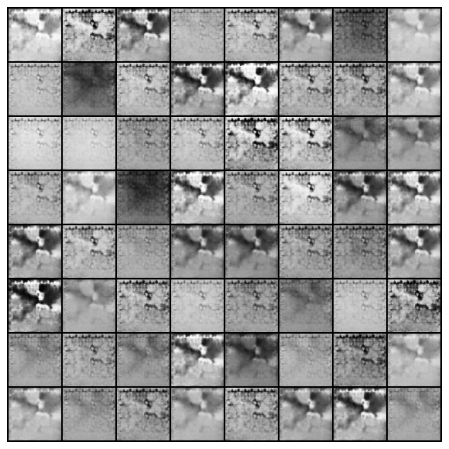

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 0.1369

[1/100][1/21]
- E_loss: 0.1423

[1/100][2/21]
- E_loss: 0.1486

[1/100][3/21]
- E_loss: 0.1746

[1/100][4/21]
- E_loss: 0.1575

[1/100][5/21]
- E_loss: 0.1767

[1/100][6/21]
- E_loss: 0.1251

[1/100][7/21]
- E_loss: 0.1607

[1/100][8/21]
- E_loss: 0.1406

[1/100][9/21]
- E_loss: 0.1528

[1/100][10/21]
- E_loss: 0.1223

[1/100][11/21]
- E_loss: 0.1420

[1/100][12/21]
- E_loss: 0.1277

[1/100][13/21]
- E_loss: 0.1292

[1/100][14/21]
- E_loss: 0.1136

[1/100][15/21]
- E_loss: 0.1471

[1/100][16/21]
- E_loss: 0.1290

[1/100][17/21]
- E_loss: 0.1203

[1/100][18/21]
- E_loss: 0.1024

[1/100][19/21]
- E_loss: 0.1168

[1/100][20/21]
- E_loss: 0.1232

[2/100][0/21]
- E_loss: 0.1186

[2/100][1/21]
- E_loss: 0.1164

[2/100][2/21]
- E_loss: 0.1266

[2/100][3/21]
- E_loss: 0.1012

[2/100][4/21]
- E_loss: 0.1079

[2/100][5/21]
- E_loss: 0.1038

[2/100][6/21]
- E_loss: 0.1141

[2/100][7/21]
- E_loss: 0.0944

[2/100][8/21]
- E_loss: 0.0786

[2/100][9/21]
- E_loss: 0.109

[13/100][0/21]
- E_loss: 0.0795

[13/100][1/21]
- E_loss: 0.0803

[13/100][2/21]
- E_loss: 0.0802

[13/100][3/21]
- E_loss: 0.0869

[13/100][4/21]
- E_loss: 0.0919

[13/100][5/21]
- E_loss: 0.0875

[13/100][6/21]
- E_loss: 0.0808

[13/100][7/21]
- E_loss: 0.1070

[13/100][8/21]
- E_loss: 0.0881

[13/100][9/21]
- E_loss: 0.0822

[13/100][10/21]
- E_loss: 0.0800

[13/100][11/21]
- E_loss: 0.0851

[13/100][12/21]
- E_loss: 0.0935

[13/100][13/21]
- E_loss: 0.0900

[13/100][14/21]
- E_loss: 0.0763

[13/100][15/21]
- E_loss: 0.0943

[13/100][16/21]
- E_loss: 0.0981

[13/100][17/21]
- E_loss: 0.0754

[13/100][18/21]
- E_loss: 0.0928

[13/100][19/21]
- E_loss: 0.1008

[13/100][20/21]
- E_loss: 0.0811

[14/100][0/21]
- E_loss: 0.0665

[14/100][1/21]
- E_loss: 0.0841

[14/100][2/21]
- E_loss: 0.0842

[14/100][3/21]
- E_loss: 0.0980

[14/100][4/21]
- E_loss: 0.0715

[14/100][5/21]
- E_loss: 0.0900

[14/100][6/21]
- E_loss: 0.0965

[14/100][7/21]
- E_loss: 0.0691

[14/100][8/21]
- E_loss: 0.1130


[24/100][15/21]
- E_loss: 0.0686

[24/100][16/21]
- E_loss: 0.0887

[24/100][17/21]
- E_loss: 0.0965

[24/100][18/21]
- E_loss: 0.0827

[24/100][19/21]
- E_loss: 0.0908

[24/100][20/21]
- E_loss: 0.0822

[25/100][0/21]
- E_loss: 0.0834

[25/100][1/21]
- E_loss: 0.0827

[25/100][2/21]
- E_loss: 0.0725

[25/100][3/21]
- E_loss: 0.0810

[25/100][4/21]
- E_loss: 0.0837

[25/100][5/21]
- E_loss: 0.1005

[25/100][6/21]
- E_loss: 0.0772

[25/100][7/21]
- E_loss: 0.0965

[25/100][8/21]
- E_loss: 0.0949

[25/100][9/21]
- E_loss: 0.0788

[25/100][10/21]
- E_loss: 0.0824

[25/100][11/21]
- E_loss: 0.0876

[25/100][12/21]
- E_loss: 0.0860

[25/100][13/21]
- E_loss: 0.1011

[25/100][14/21]
- E_loss: 0.0737

[25/100][15/21]
- E_loss: 0.0909

[25/100][16/21]
- E_loss: 0.0901

[25/100][17/21]
- E_loss: 0.0932

[25/100][18/21]
- E_loss: 0.0918

[25/100][19/21]
- E_loss: 0.0805

[25/100][20/21]
- E_loss: 0.0771

[26/100][0/21]
- E_loss: 0.0813

[26/100][1/21]
- E_loss: 0.0781

[26/100][2/21]
- E_loss: 0

[36/100][9/21]
- E_loss: 0.0832

[36/100][10/21]
- E_loss: 0.0794

[36/100][11/21]
- E_loss: 0.0743

[36/100][12/21]
- E_loss: 0.0831

[36/100][13/21]
- E_loss: 0.0781

[36/100][14/21]
- E_loss: 0.0871

[36/100][15/21]
- E_loss: 0.0935

[36/100][16/21]
- E_loss: 0.0908

[36/100][17/21]
- E_loss: 0.0736

[36/100][18/21]
- E_loss: 0.0898

[36/100][19/21]
- E_loss: 0.0847

[36/100][20/21]
- E_loss: 0.0760

[37/100][0/21]
- E_loss: 0.0873

[37/100][1/21]
- E_loss: 0.0808

[37/100][2/21]
- E_loss: 0.0863

[37/100][3/21]
- E_loss: 0.0721

[37/100][4/21]
- E_loss: 0.0833

[37/100][5/21]
- E_loss: 0.0759

[37/100][6/21]
- E_loss: 0.0874

[37/100][7/21]
- E_loss: 0.0942

[37/100][8/21]
- E_loss: 0.0934

[37/100][9/21]
- E_loss: 0.0704

[37/100][10/21]
- E_loss: 0.0767

[37/100][11/21]
- E_loss: 0.0699

[37/100][12/21]
- E_loss: 0.0948

[37/100][13/21]
- E_loss: 0.1136

[37/100][14/21]
- E_loss: 0.0863

[37/100][15/21]
- E_loss: 0.0712

[37/100][16/21]
- E_loss: 0.0808

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 0.0868

[48/100][4/21]
- E_loss: 0.0966

[48/100][5/21]
- E_loss: 0.0854

[48/100][6/21]
- E_loss: 0.0602

[48/100][7/21]
- E_loss: 0.0629

[48/100][8/21]
- E_loss: 0.0687

[48/100][9/21]
- E_loss: 0.0858

[48/100][10/21]
- E_loss: 0.0735

[48/100][11/21]
- E_loss: 0.0892

[48/100][12/21]
- E_loss: 0.0948

[48/100][13/21]
- E_loss: 0.0719

[48/100][14/21]
- E_loss: 0.0824

[48/100][15/21]
- E_loss: 0.0877

[48/100][16/21]
- E_loss: 0.0786

[48/100][17/21]
- E_loss: 0.0852

[48/100][18/21]
- E_loss: 0.0940

[48/100][19/21]
- E_loss: 0.0844

[48/100][20/21]
- E_loss: 0.0728

[49/100][0/21]
- E_loss: 0.0778

[49/100][1/21]
- E_loss: 0.1028

[49/100][2/21]
- E_loss: 0.0651

[49/100][3/21]
- E_loss: 0.0825

[49/100][4/21]
- E_loss: 0.0805

[49/100][5/21]
- E_loss: 0.0790

[49/100][6/21]
- E_loss: 0.0924

[49/100][7/21]
- E_loss: 0.0714

[49/100][8/21]
- E_loss: 0.1065

[49/100][9/21]
- E_loss: 0.0824

[49/100][10/21]
- E_loss: 0.1040

[49/100][11/21]
- E_loss: 0.069

[59/100][18/21]
- E_loss: 0.0710

[59/100][19/21]
- E_loss: 0.0956

[59/100][20/21]
- E_loss: 0.0945

[60/100][0/21]
- E_loss: 0.0854

[60/100][1/21]
- E_loss: 0.0722

[60/100][2/21]
- E_loss: 0.0805

[60/100][3/21]
- E_loss: 0.0877

[60/100][4/21]
- E_loss: 0.0677

[60/100][5/21]
- E_loss: 0.1146

[60/100][6/21]
- E_loss: 0.0912

[60/100][7/21]
- E_loss: 0.0820

[60/100][8/21]
- E_loss: 0.0783

[60/100][9/21]
- E_loss: 0.0921

[60/100][10/21]
- E_loss: 0.0806

[60/100][11/21]
- E_loss: 0.0853

[60/100][12/21]
- E_loss: 0.0902

[60/100][13/21]
- E_loss: 0.0589

[60/100][14/21]
- E_loss: 0.0603

[60/100][15/21]
- E_loss: 0.0704

[60/100][16/21]
- E_loss: 0.0894

[60/100][17/21]
- E_loss: 0.0899

[60/100][18/21]
- E_loss: 0.0997

[60/100][19/21]
- E_loss: 0.0757

[60/100][20/21]
- E_loss: 0.0617

[61/100][0/21]
- E_loss: 0.0713

[61/100][1/21]
- E_loss: 0.0833

[61/100][2/21]
- E_loss: 0.0892

[61/100][3/21]
- E_loss: 0.0801

[61/100][4/21]
- E_loss: 0.0843

[61/100][5/21]
- E_loss: 0.07

[71/100][12/21]
- E_loss: 0.0819

[71/100][13/21]
- E_loss: 0.0708

[71/100][14/21]
- E_loss: 0.0826

[71/100][15/21]
- E_loss: 0.0794

[71/100][16/21]
- E_loss: 0.0793

[71/100][17/21]
- E_loss: 0.0978

[71/100][18/21]
- E_loss: 0.0917

[71/100][19/21]
- E_loss: 0.0690

[71/100][20/21]
- E_loss: 0.0893

[72/100][0/21]
- E_loss: 0.0657

[72/100][1/21]
- E_loss: 0.0700

[72/100][2/21]
- E_loss: 0.0607

[72/100][3/21]
- E_loss: 0.0633

[72/100][4/21]
- E_loss: 0.0755

[72/100][5/21]
- E_loss: 0.0867

[72/100][6/21]
- E_loss: 0.0840

[72/100][7/21]
- E_loss: 0.0888

[72/100][8/21]
- E_loss: 0.0644

[72/100][9/21]
- E_loss: 0.0628

[72/100][10/21]
- E_loss: 0.0846

[72/100][11/21]
- E_loss: 0.0795

[72/100][12/21]
- E_loss: 0.0782

[72/100][13/21]
- E_loss: 0.0837

[72/100][14/21]
- E_loss: 0.0968

[72/100][15/21]
- E_loss: 0.0792

[72/100][16/21]
- E_loss: 0.0673

[72/100][17/21]
- E_loss: 0.0935

[72/100][18/21]
- E_loss: 0.0830

[72/100][19/21]
- E_loss: 0.1058

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 0.0820

[83/100][7/21]
- E_loss: 0.0775

[83/100][8/21]
- E_loss: 0.0732

[83/100][9/21]
- E_loss: 0.0733

[83/100][10/21]
- E_loss: 0.0842

[83/100][11/21]
- E_loss: 0.0748

[83/100][12/21]
- E_loss: 0.0873

[83/100][13/21]
- E_loss: 0.0883

[83/100][14/21]
- E_loss: 0.0846

[83/100][15/21]
- E_loss: 0.0929

[83/100][16/21]
- E_loss: 0.0753

[83/100][17/21]
- E_loss: 0.0686

[83/100][18/21]
- E_loss: 0.0804

[83/100][19/21]
- E_loss: 0.0835

[83/100][20/21]
- E_loss: 0.0684

[84/100][0/21]
- E_loss: 0.0621

[84/100][1/21]
- E_loss: 0.0812

[84/100][2/21]
- E_loss: 0.0845

[84/100][3/21]
- E_loss: 0.0797

[84/100][4/21]
- E_loss: 0.0621

[84/100][5/21]
- E_loss: 0.0822

[84/100][6/21]
- E_loss: 0.0662

[84/100][7/21]
- E_loss: 0.0963

[84/100][8/21]
- E_loss: 0.0942

[84/100][9/21]
- E_loss: 0.0788

[84/100][10/21]
- E_loss: 0.0678

[84/100][11/21]
- E_loss: 0.0629

[84/100][12/21]
- E_loss: 0.0724

[84/100][13/21]
- E_loss: 0.0786

[84/100][14/21]
- E_loss: 0.

[95/100][0/21]
- E_loss: 0.0812

[95/100][1/21]
- E_loss: 0.0875

[95/100][2/21]
- E_loss: 0.1007

[95/100][3/21]
- E_loss: 0.0705

[95/100][4/21]
- E_loss: 0.0730

[95/100][5/21]
- E_loss: 0.0905

[95/100][6/21]
- E_loss: 0.0674

[95/100][7/21]
- E_loss: 0.0887

[95/100][8/21]
- E_loss: 0.0836

[95/100][9/21]
- E_loss: 0.0679

[95/100][10/21]
- E_loss: 0.0774

[95/100][11/21]
- E_loss: 0.0587

[95/100][12/21]
- E_loss: 0.0764

[95/100][13/21]
- E_loss: 0.0573

[95/100][14/21]
- E_loss: 0.0841

[95/100][15/21]
- E_loss: 0.0871

[95/100][16/21]
- E_loss: 0.0727

[95/100][17/21]
- E_loss: 0.0837

[95/100][18/21]
- E_loss: 0.0785

[95/100][19/21]
- E_loss: 0.0844

[95/100][20/21]
- E_loss: 0.0820

[96/100][0/21]
- E_loss: 0.0573

[96/100][1/21]
- E_loss: 0.0702

[96/100][2/21]
- E_loss: 0.0697

[96/100][3/21]
- E_loss: 0.0965

[96/100][4/21]
- E_loss: 0.0704

[96/100][5/21]
- E_loss: 0.0906

[96/100][6/21]
- E_loss: 0.0588

[96/100][7/21]
- E_loss: 0.0885

[96/100][8/21]
- E_loss: 0.0723


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

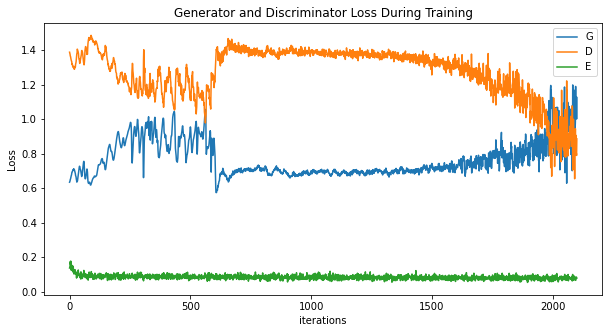

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

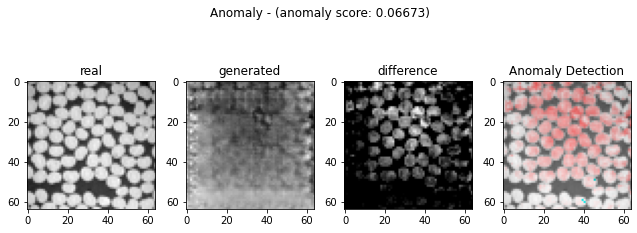

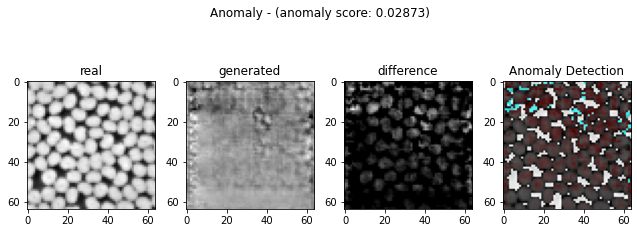

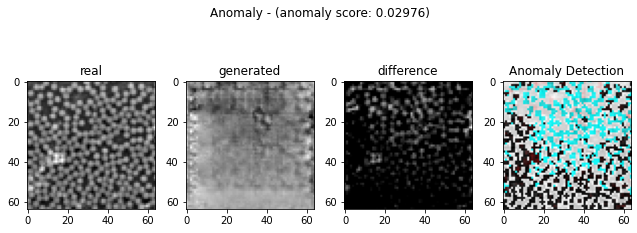

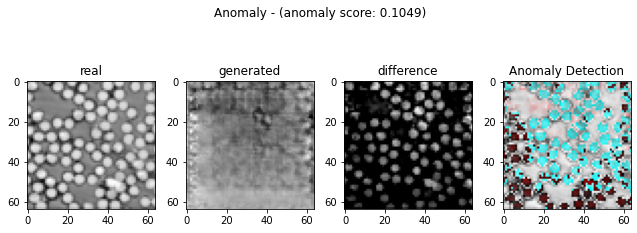

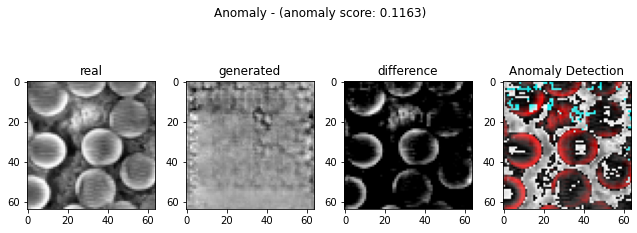

...

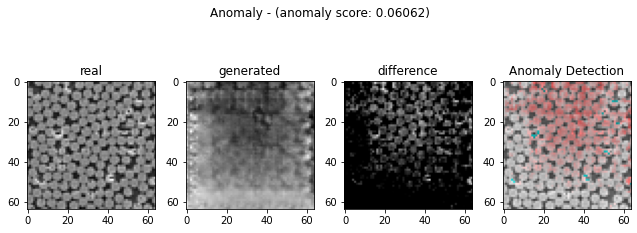

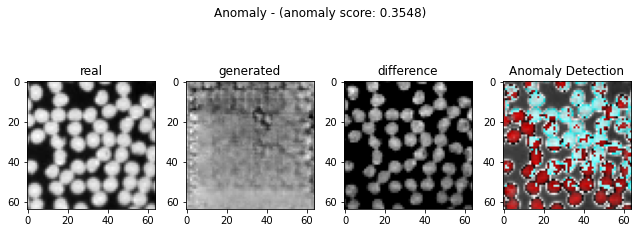

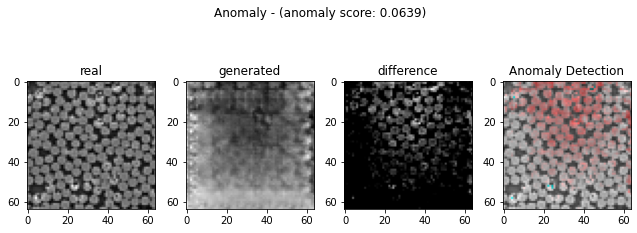

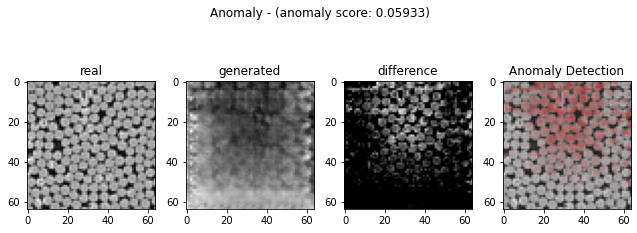

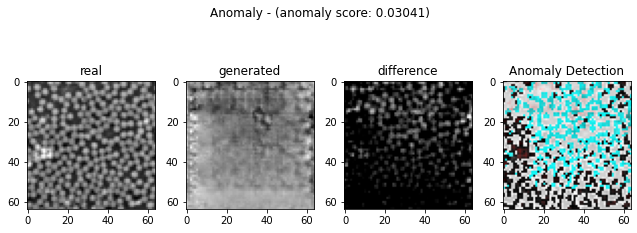

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.51806641 0.53930664 0.44262695 0.46191406 0.40454102 0.453125
 0.49682617 0.64672852 0.44335938 0.52709961 0.33276367 0.51757812
 0.48193359 0.48779297 0.58081055 0.44628906 0.38916016 0.4128418
 0.28417969 0.46191406 0.44116211 0.46801758 0.50366211 0.40063477
 0.52539062 0.48706055 0.57910156 0.5168457  0.50366211 0.50830078
 0.45117188 0.41625977 0.51928711 0.48901367 0.54858398 0.50830078
 0.49169922 0.48339844 0.48193359 0.47314453 0.40551758 0.51293945
 0.46655273 0.43505859 0.52124023 0.55004883 0.44116211 0.51489258
 0.45874023 0.48754883 0.61816406 0.40454102 0.38012695 0.43334961
 0.58862305 0.46801758 0.52978516 0.41699219 0.46069336 0.46875   ]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.47813720703125

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.10699885717959667, 0.07588499473405708, 0.0678906595113973, 0.031110148013034133, 0.04534609991040882, 0.08316369718891681, 0.01747723498759335, -0.018650808708548457, 0.04699083351010272, 0.07254292753466068, -0.06163701495424068, 0.08684347407708327, 0.05325246123201313, 0.10336974387917042, 0.0892861155885141, 0.04929047083675238, 0.16011725243489167, 0.14051300525063418, 0.27440503855468745, 0.10053475565460693, 0.06873097816837492, 0.035462396475538435, 0.006135024919152203, 0.019229321809156832, 0.0975677443995226, 0.027601910258248537, 0.00751823065245121, 0.08578478660403793, 0.09616845755855229, -0.04407718351814804, 0.07276536923482106, 0.10156788214918626, -0.008631114544553968, 0.07785436905519169, 0.0008525665959637071, 0.047874102132786325, 0.02574844666096389, 0.11676405479183215, -0.01782905540046298, 0.053391488385787805, 0.0873678605574904, 0.08489563095054135, 0.03885166126339876, 0.08924228307496027, -0.011633053613740374, 0.010695901107575095, 0.0928562574101138

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

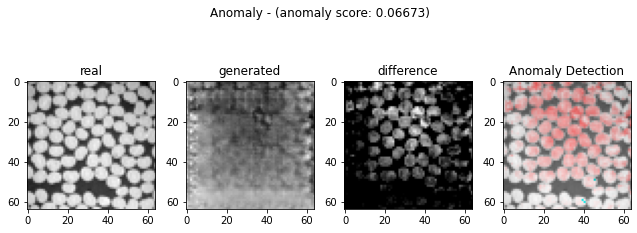

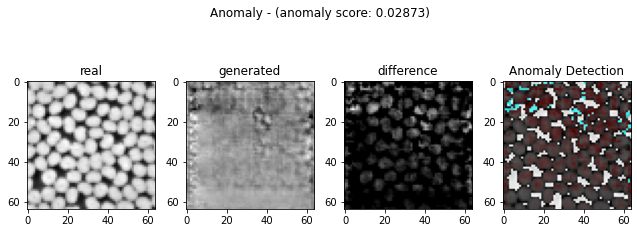

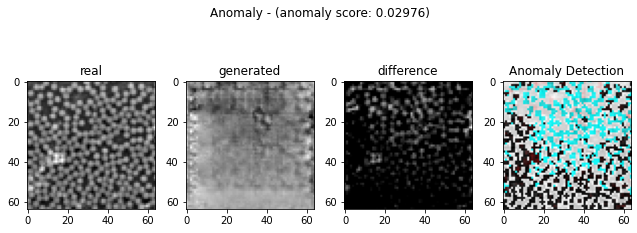

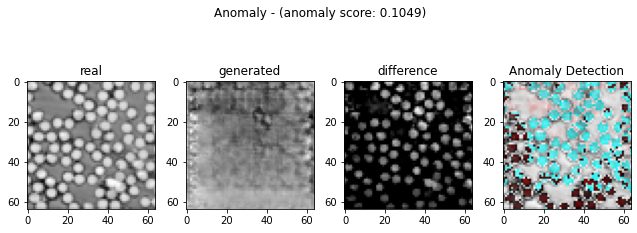

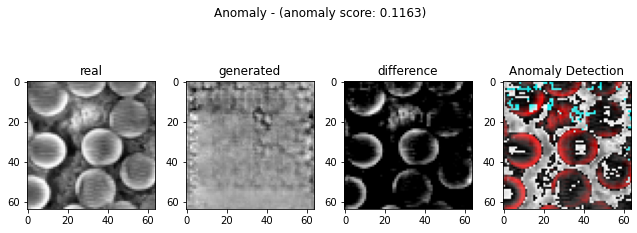

...

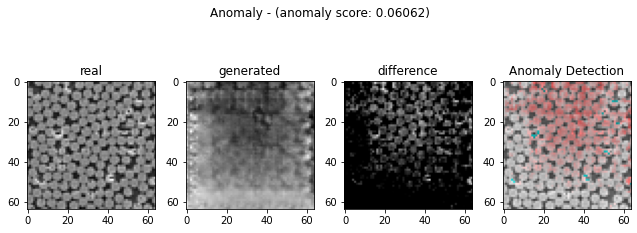

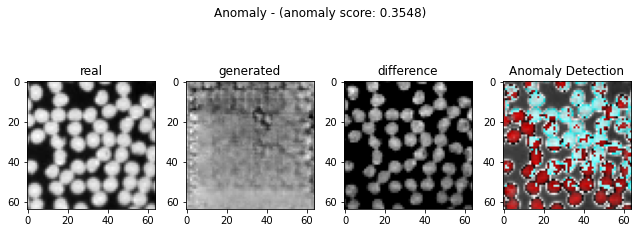

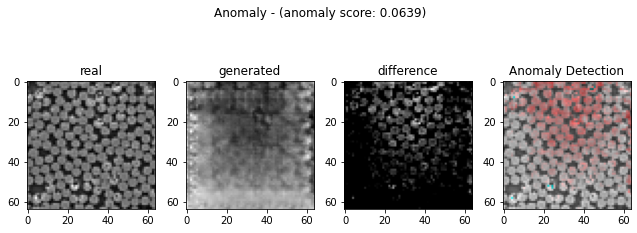

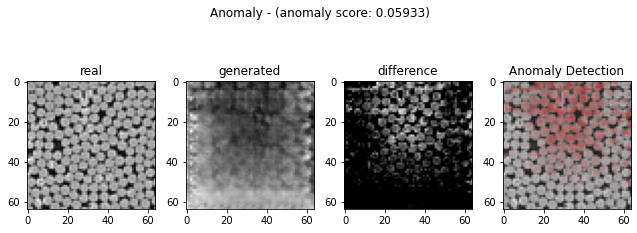

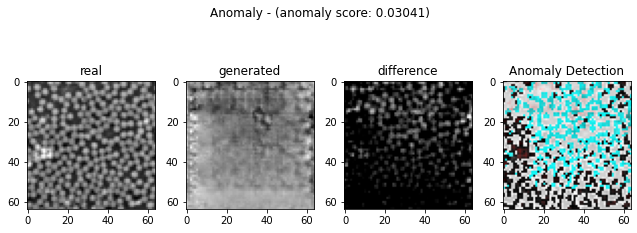

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.51806641 0.53930664 0.44262695 0.46191406 0.40454102 0.453125
 0.49682617 0.64672852 0.44335938 0.52709961 0.33276367 0.51757812
 0.48193359 0.48779297 0.58081055 0.44628906 0.38916016 0.4128418
 0.28417969 0.46191406 0.44116211 0.46801758 0.50366211 0.40063477
 0.52539062 0.48706055 0.57910156 0.5168457  0.50366211 0.50830078
 0.45117188 0.41625977 0.51928711 0.48901367 0.54858398 0.50830078
 0.49169922 0.48339844 0.48193359 0.47314453 0.40551758 0.51293945
 0.46655273 0.43505859 0.52124023 0.55004883 0.44116211 0.51489258
 0.45874023 0.48754883 0.61816406 0.40454102 0.38012695 0.43334961
 0.58862305 0.46801758 0.52978516 0.41699219 0.46069336 0.46875   ]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[0.10699885717959667, 0.07588499473405708, 0.0678906595113973, 0.031110148013034133, 0.04534609991040882, 0.08316369718891681, 0.01747723498759335, -0.018650808708548457, 0.04699083351010272, 0.07254292753466068, -0.06163701495424068, 0.08684347407708327, 0.05325246123201313, 0.10336974387917042, 0.0892861155885141, 0.04929047083675238, 0.16011725243489167, 0.14051300525063418, 0.27440503855468745, 0.10053475565460693, 0.06873097816837492, 0.035462396475538435, 0.006135024919152203, 0.019229321809156832, 0.0975677443995226, 0.027601910258248537, 0.00751823065245121, 0.08578478660403793, 0.09616845755855229, -0.04407718351814804, 0.07276536923482106, 0.10156788214918626, -0.008631114544553968, 0.07785436905519169, 0.0008525665959637071, 0.047874102132786325, 0.02574844666096389, 0.11676405479183215, -0.01782905540046298, 0.053391488385787805, 0.0873678605574904, 0.08489563095054135, 0.03885166126339876, 0.08924228307496027, -0.011633053613740374, 0.010695901107575095, 0.0928562574101138

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[188, 188, 188],
         [192, 192, 192],
         [194, 194, 194],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[136, 136, 136],
         [180, 180, 180],
         [182, 182, 182],
         ...,
         [190, 190, 190],
         [184, 184, 184],
         [188, 188, 188]],
 
        [[186, 186, 186],
         [180, 180, 180],
         [127, 127, 127],
         ...,
         [188, 177, 177],
         [184, 177, 177],
         [190, 190, 190]],
 
        ...,
 
        [[180, 180, 180],
         [206, 206, 206],
         [206, 206, 206],
         ...,
         [226, 226, 226],
         [232, 228, 228],
         [150, 150, 150]],
 
        [[172, 172, 172],
         [113, 113, 113],
         [198, 198, 198],
         ...,
         [228, 228, 228],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[188, 188, 188],
         [166, 166, 166],
         [222, 222, 222],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[2.29503418 2.38912842 1.9608374  2.0462793  1.7921167  2.00734375
 2.20093994 2.86500732 1.96408203 2.33505127 1.47414307 2.29287109
 2.13496582 2.16092285 2.57299072 1.97706055 1.72397949 1.82888916
 1.25891602 2.0462793  1.95434814 2.07331787 2.23122314 1.77481201
 2.32748047 2.15767822 2.56541992 2.28962646 2.23122314 2.25177246
 1.99869141 1.84403076 2.30044189 2.16633057 2.43022705 2.25177246
 2.17822754 2.14145508 2.13496582 2.09603027 1.79644287 2.27232178
 2.06682861 1.92730957 2.30909424 2.43671631 1.95434814 2.28097412
 2.03221924 2.15984131 2.7384668  1.7921167  1.6839624  1.91973877
 2.6076001  2.07331787 2.34694824 1.84727539 2.04087158 2.0765625 ]
